Necessary packages:

In [79]:
import glob
import os
import warnings


import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import pydicom
from pydicom.data import get_testdata_files
from sklearn.model_selection import train_test_split

from IPython.display import Markdown, display

 # Import functions from the module
import importlib
import help_files._0_definitions 
import  help_files._1_visuals_script
# import  help_files._01_load_data
 # Reload the module to apply the changes to the script
importlib.reload(help_files._0_definitions)
importlib.reload(help_files._1_visuals_script)
# importlib.reload(help_files._01_load_data)
import  help_files._1_visuals_script  as pauls_vs

# Define the path
from pathlib import Path

 

In [80]:
### In definitions are all the functions that are used in the notebook and globals
with open("help_files/_0_definitions.py") as file:
    exec(file.read())

In [81]:
# Load the data from _01_load_data
file_names = ["X_train.csv", "X_train_coor.csv", "X_train_des.csv"]
dataframes = [pd.read_csv(data_path_vor / file_name) for file_name in file_names]
X_train, X_train_coor, X_train_des = dataframes

### X_train manipulation

In [82]:
X_train

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,left_neural_foraminal_narrowing_l5_s1,right_neural_foraminal_narrowing_l1_l2,right_neural_foraminal_narrowing_l2_l3,right_neural_foraminal_narrowing_l3_l4,right_neural_foraminal_narrowing_l4_l5,right_neural_foraminal_narrowing_l5_s1,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


In [83]:
# Summary statistics of the dataframe
summary = X_train.describe(include='all')

# Information about the dataframe
info = X_train.info()

# Display the summary and info
print(summary)
print(info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   study_id                                1 non-null      int64 
 1   spinal_canal_stenosis_l1_l2             1 non-null      object
 2   spinal_canal_stenosis_l2_l3             1 non-null      object
 3   spinal_canal_stenosis_l3_l4             1 non-null      object
 4   spinal_canal_stenosis_l4_l5             1 non-null      object
 5   spinal_canal_stenosis_l5_s1             1 non-null      object
 6   left_neural_foraminal_narrowing_l1_l2   1 non-null      object
 7   left_neural_foraminal_narrowing_l2_l3   1 non-null      object
 8   left_neural_foraminal_narrowing_l3_l4   1 non-null      object
 9   left_neural_foraminal_narrowing_l4_l5   1 non-null      object
 10  left_neural_foraminal_narrowing_l5_s1   1 non-null      object
 11  right_neur

In [84]:
X_train.dtypes

study_id                                   int64
spinal_canal_stenosis_l1_l2               object
spinal_canal_stenosis_l2_l3               object
spinal_canal_stenosis_l3_l4               object
spinal_canal_stenosis_l4_l5               object
spinal_canal_stenosis_l5_s1               object
left_neural_foraminal_narrowing_l1_l2     object
left_neural_foraminal_narrowing_l2_l3     object
left_neural_foraminal_narrowing_l3_l4     object
left_neural_foraminal_narrowing_l4_l5     object
left_neural_foraminal_narrowing_l5_s1     object
right_neural_foraminal_narrowing_l1_l2    object
right_neural_foraminal_narrowing_l2_l3    object
right_neural_foraminal_narrowing_l3_l4    object
right_neural_foraminal_narrowing_l4_l5    object
right_neural_foraminal_narrowing_l5_s1    object
left_subarticular_stenosis_l1_l2          object
left_subarticular_stenosis_l2_l3          object
left_subarticular_stenosis_l3_l4          object
left_subarticular_stenosis_l4_l5          object
left_subarticular_st

In [85]:
# List of columns to iterate through: 
columns_to_iterate = [
    'spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3', 'spinal_canal_stenosis_l3_l4',
    'spinal_canal_stenosis_l4_l5', 'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2',
    'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4', 'left_neural_foraminal_narrowing_l4_l5',
    'left_neural_foraminal_narrowing_l5_s1', 'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3',
    'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5', 'right_neural_foraminal_narrowing_l5_s1',
    'left_subarticular_stenosis_l1_l2', 'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4',
    'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1', 'right_subarticular_stenosis_l1_l2',
    'right_subarticular_stenosis_l2_l3', 'right_subarticular_stenosis_l3_l4', 'right_subarticular_stenosis_l4_l5',
    'right_subarticular_stenosis_l5_s1'
]


# Example operation: Fill missing values with 'Unknown'
for column in columns_to_iterate:
    X_train[column] = X_train[column].map({'Normal/Mild': 1, 'Moderate': 2, 'Severe': 3})

X_train

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,left_neural_foraminal_narrowing_l5_s1,right_neural_foraminal_narrowing_l1_l2,right_neural_foraminal_narrowing_l2_l3,right_neural_foraminal_narrowing_l3_l4,right_neural_foraminal_narrowing_l4_l5,right_neural_foraminal_narrowing_l5_s1,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,1,1,1,1,1,1,1,1,2,1,1,1,2,2,1,1,1,1,2,1,1,1,1,1,1


In [86]:
### Distribution of the target variables 

In [87]:
# Create an empty list to store the distribution data
distribution_data = []

# Calculate the distribution for each column
for column in columns_to_iterate:
    counts = X_train[column].value_counts().sort_index()
    total_counts = counts.sum()
    distribution_data.append({
        'Condition': column,
        'Normal/Mild': counts.get(1.0, 0),
        'Moderate': counts.get(2.0, 0),
        'Severe': counts.get(3.0, 0)
    })
    distribution_data[-1]['Normal/Mild (%)'] = (counts.get(1.0, 0) / total_counts) * 100
    distribution_data[-1]['Moderate (%)'] = (counts.get(2.0, 0) / total_counts) * 100
    distribution_data[-1]['Severe (%)'] = (counts.get(3.0, 0) / total_counts) * 100

# Convert the list to a DataFrame
distribution_df = pd.DataFrame(distribution_data)

# Display the distribution DataFrame
print(distribution_df)

# Summarize the columns to iterate
summary_stats = X_train[columns_to_iterate].describe(include='all')
print(summary_stats)


                                 Condition  Normal/Mild  Moderate  Severe  Normal/Mild (%)  Moderate (%)  Severe (%)
0              spinal_canal_stenosis_l1_l2            1         0       0            100.0           0.0         0.0
1              spinal_canal_stenosis_l2_l3            1         0       0            100.0           0.0         0.0
2              spinal_canal_stenosis_l3_l4            1         0       0            100.0           0.0         0.0
3              spinal_canal_stenosis_l4_l5            1         0       0            100.0           0.0         0.0
4              spinal_canal_stenosis_l5_s1            1         0       0            100.0           0.0         0.0
5    left_neural_foraminal_narrowing_l1_l2            1         0       0            100.0           0.0         0.0
6    left_neural_foraminal_narrowing_l2_l3            1         0       0            100.0           0.0         0.0
7    left_neural_foraminal_narrowing_l3_l4            1         

In [88]:
X_train_des

,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR
1,4003253,1054713880,Sagittal T1
2,4003253,2448190387,Axial T2


In [89]:
## reshaping the data from wide to long
reshape_list = ['spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3', 'spinal_canal_stenosis_l3_l4', 'spinal_canal_stenosis_l4_l5', 'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2', 'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4', 'left_neural_foraminal_narrowing_l4_l5', 'left_neural_foraminal_narrowing_l5_s1', 'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3', 'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5', 'right_neural_foraminal_narrowing_l5_s1', 'left_subarticular_stenosis_l1_l2', 'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4', 'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1', 'right_subarticular_stenosis_l1_l2', 'right_subarticular_stenosis_l2_l3', 'right_subarticular_stenosis_l3_l4', 'right_subarticular_stenosis_l4_l5', 'right_subarticular_stenosis_l5_s1']  
# Assuming df is your DataFrame
reshaped_train = pd.melt(X_train, 
                  id_vars=["study_id"],  # Keep study_id as is
                  var_name="categorie",  # New column for the condition names
                  value_name="severity")   # New column for the values

# Display the reshaped DataFrame
# Ensure the file is not open in another program and you have write permissions
# reshaped_train.to_csv(path / "starfor_sorting_new.csv",  index=False)
 
 
X_train = reshaped_train
X_train = X_train.sort_values(by=['study_id', 'categorie'], ignore_index=True)
X_train.head()

,study_id,categorie,severity
0,4003253,left_neural_foraminal_narrowing_l1_l2,1
1,4003253,left_neural_foraminal_narrowing_l2_l3,1
2,4003253,left_neural_foraminal_narrowing_l3_l4,1
3,4003253,left_neural_foraminal_narrowing_l4_l5,2
4,4003253,left_neural_foraminal_narrowing_l5_s1,1


In [90]:
# Split the string into two parts: 'spinal_canal_stenosis' and 'l1_l2'
split_columns = X_train['categorie'].str.rsplit('_', n=2)
# Combine the first part as 'condition' and the last two parts as 'level'
X_train['condition'] = split_columns.str[0]
X_train['level'] = split_columns.str[1] + '_' + split_columns.str[2]

X_train 

,study_id,categorie,severity,condition,level
0,4003253,left_neural_foraminal_narrowing_l1_l2,1,left_neural_foraminal_narrowing,l1_l2
1,4003253,left_neural_foraminal_narrowing_l2_l3,1,left_neural_foraminal_narrowing,l2_l3
2,4003253,left_neural_foraminal_narrowing_l3_l4,1,left_neural_foraminal_narrowing,l3_l4
3,4003253,left_neural_foraminal_narrowing_l4_l5,2,left_neural_foraminal_narrowing,l4_l5
4,4003253,left_neural_foraminal_narrowing_l5_s1,1,left_neural_foraminal_narrowing,l5_s1
5,4003253,left_subarticular_stenosis_l1_l2,1,left_subarticular_stenosis,l1_l2
6,4003253,left_subarticular_stenosis_l2_l3,1,left_subarticular_stenosis,l2_l3
7,4003253,left_subarticular_stenosis_l3_l4,1,left_subarticular_stenosis,l3_l4
8,4003253,left_subarticular_stenosis_l4_l5,2,left_subarticular_stenosis,l4_l5
9,4003253,left_subarticular_stenosis_l5_s1,1,left_subarticular_stenosis,l5_s1


In [91]:
## adjusting srtings: disenabling the _ and making all lower case
X_train['condition'] = X_train['condition'].str.replace('_', ' ')
X_train['level'] = X_train['level'].str.replace('_', '/')


X_train_coor['condition'] = X_train_coor['condition'].str.lower()
X_train_coor['level'] = X_train_coor['level'].str.lower()
X_train.head()

,study_id,categorie,severity,condition,level
0,4003253,left_neural_foraminal_narrowing_l1_l2,1,left neural foraminal narrowing,l1/l2
1,4003253,left_neural_foraminal_narrowing_l2_l3,1,left neural foraminal narrowing,l2/l3
2,4003253,left_neural_foraminal_narrowing_l3_l4,1,left neural foraminal narrowing,l3/l4
3,4003253,left_neural_foraminal_narrowing_l4_l5,2,left neural foraminal narrowing,l4/l5
4,4003253,left_neural_foraminal_narrowing_l5_s1,1,left neural foraminal narrowing,l5/s1


### Select which kind of damage

In [92]:

# keep only left neural foraminal narrowing
# Filter the DataFrame to keep only rows where the condition is either left_subarticular_stenosis_l4_l5 or right_subarticular_stenosis_l4_l5
filtered_df = X_train[(X_train['condition'].str.contains('left neural foraminal narrowing')) & (X_train['level'] == 'l5/s1')]
print(filtered_df)

X_train = filtered_df


   study_id                              categorie  severity                        condition  level
4   4003253  left_neural_foraminal_narrowing_l5_s1         1  left neural foraminal narrowing  l5/s1


In [93]:
X_train 

,study_id,categorie,severity,condition,level
4,4003253,left_neural_foraminal_narrowing_l5_s1,1,left neural foraminal narrowing,l5/s1


In [94]:
unique_study_ids_train = X_train['study_id'].nunique()
unique_study_ids_train_coor = X_train_coor['study_id'].nunique()

print(f"Number of unique study_id in X_train: {unique_study_ids_train}")
print(f"Number of unique study_id in X_train_coor: {unique_study_ids_train_coor}")

Number of unique study_id in X_train: 1
Number of unique study_id in X_train_coor: 1


In [95]:
 # get rid of persons with no coordinates
X_train = X_train[X_train['study_id'].isin(X_train_coor['study_id'])]

In [96]:
unique_study_ids_train = X_train['study_id'].nunique()
unique_study_ids_train_coor = X_train_coor['study_id'].nunique()

print(f"Number of unique study_id in X_train: {unique_study_ids_train}")
print(f"Number of unique study_id in X_train_coor: {unique_study_ids_train_coor}")

Number of unique study_id in X_train: 1
Number of unique study_id in X_train_coor: 1


In [97]:
# Perform a left join between merged_df an X_train on multiple variables
merged_df = pd.merge(X_train, X_train_coor, on=['study_id', 'condition', 'level'], how='left')
# Display the merged DataFrame
merged_df.head()

,study_id,categorie,severity,condition,level,series_id,instance_number,x,y
0,4003253,left_neural_foraminal_narrowing_l5_s1,1,left neural foraminal narrowing,l5/s1,1054713880,11,197.100569,289.457306


### some statistics of data set

In [98]:
# Count total rows in each DataFrame before the merge
print(f"Rows in X_train: {len(X_train)}")
print(f"Rows in X_train_coor: {len(X_train_coor)}")

# Count total rows in the merged DataFrame
print(f"Rows in merged_df: {len(merged_df)}")

# Find out how many rows have missing values in columns from X_train_coor after the merge
# Assuming columns from X_train_coor start with a common prefix or are listed in a known list
columns_from_X_train_coor = [col for col in X_train_coor.columns if col not in ['study_id', 'condition', 'level']]
missing_rows = merged_df[columns_from_X_train_coor].isnull().all(axis=1).sum()

# Create a new DataFrame for study_ids with at least one row having missing values in columns from X_train_coor
missing_study_ids = merged_df[merged_df[columns_from_X_train_coor].isnull().any(axis=1)]['study_id'].unique()
missing_persons_df = merged_df[merged_df['study_id'].isin(missing_study_ids)]
missing_persons_df = missing_persons_df.sort_values(by=['study_id', 'categorie'], ignore_index=True)
 

print(f"Rows in merged_df without matching rows in X_train_coor: {missing_rows}")
print(f"Rows in merged_df with matches from X_train_coor: {len(merged_df) - missing_rows}")

Rows in X_train: 1
Rows in X_train_coor: 25
Rows in merged_df: 1
Rows in merged_df without matching rows in X_train_coor: 0
Rows in merged_df with matches from X_train_coor: 1


In [99]:
missing_persons_df.head()

,study_id,categorie,severity,condition,level,series_id,instance_number,x,y


In [100]:
# drop rows with missing values in columns from X_train_coor
merged_df = merged_df.dropna(subset=columns_from_X_train_coor)
display(Markdown('<span style="color:red">later on to take it back to the original shape : 48692</span>'))

<span style="color:red">later on to take it back to the original shape : 48692</span>

In [101]:
merged_df

,study_id,categorie,severity,condition,level,series_id,instance_number,x,y
0,4003253,left_neural_foraminal_narrowing_l5_s1,1,left neural foraminal narrowing,l5/s1,1054713880,11,197.100569,289.457306


### Folder with images: preparing paths for merging with main data 

* define which mri type adequate for my 

In [102]:
X_train_des.dtypes

study_id               int64
series_id              int64
series_description    object
dtype: object

In [103]:
X_train_des = X_train_des[X_train_des['series_description'] == 'Sagittal T2/STIR']
X_train_des.head()

,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR


### Paths to images: two options how to do

In [104]:
# using X_train_desÖ Ecxell table is better than taking the path from the folders 
import re

def paths_to_images(df, data_dir):
    image_paths = []
    for study_id, series_id in zip(df['study_id'], df['series_id']):
        study_dir = os.path.join(data_dir, str(study_id))
        series_dir = os.path.join(study_dir, str(series_id))
        
        # List images in the series directory
        images = os.listdir(series_dir)
        # Create full paths for each image
        image_paths.extend([os.path.join(series_dir, img) for img in images])
        
    return image_paths

image_paths = paths_to_images(X_train_des, os.path.join("data/train_images"))

# Sort the image paths to ensure numerical order
def numerical_sort(value):
    parts = re.split(r'(\d+)', value)
    return [int(part) if part.isdigit() else part for part in parts]

image_paths = sorted(image_paths, key=numerical_sort)
image_paths[:75]

df_image_paths = pd.DataFrame(image_paths, columns=['image_path'])
df_image_paths.head()

,image_path
0,data/train_images\4003253\702807833\1.dcm
1,data/train_images\4003253\702807833\2.dcm
2,data/train_images\4003253\702807833\3.dcm
3,data/train_images\4003253\702807833\4.dcm
4,data/train_images\4003253\702807833\5.dcm


In [105]:
 #  Using real folders and images:  
# path to images folder and images inside the folder
import re
# Define the main directory
main_dir = "data/train_images"

def paths_to_images_2(main_dir):
    image_paths = []
    # Walk through the directory structure starting from the main directory
    for root, subdirs, files in os.walk(main_dir):
        for file in files:
            # Create the full path for each image
            print(file)
            file_path = os.path.join(root, file)
            image_paths.append(file_path)

    return image_paths

paths_to_images_2(main_dir)



################   sort path images in numerical order  
# Define the main directory
main_dir = "data/train_images"

# Get the image paths
image_paths2 = paths_to_images_2(main_dir)

# Sort the image paths to ensure numerical order
def numerical_sort(value):
    parts = re.split(r'(\d+)', value)
    return [int(part) if part.isdigit() else part for part in parts]

image_paths2 = sorted(image_paths2, key=numerical_sort)
image_paths2[:75]

df_image_paths2 = pd.DataFrame(image_paths2, columns=['image_path'])
df_image_paths2.head()
 

1.dcm
10.dcm
11.dcm
12.dcm
13.dcm
14.dcm
15.dcm
16.dcm
17.dcm
18.dcm
19.dcm
2.dcm
20.dcm
21.dcm
22.dcm
23.dcm
24.dcm
25.dcm
26.dcm
27.dcm
28.dcm
29.dcm
3.dcm
30.dcm
31.dcm
32.dcm
33.dcm
34.dcm
35.dcm
36.dcm
37.dcm
38.dcm
39.dcm
4.dcm
40.dcm
41.dcm
42.dcm
43.dcm
44.dcm
45.dcm
46.dcm
47.dcm
48.dcm
49.dcm
5.dcm
50.dcm
51.dcm
52.dcm
53.dcm
54.dcm
55.dcm
56.dcm
57.dcm
58.dcm
59.dcm
6.dcm
60.dcm
7.dcm
8.dcm
9.dcm
1.dcm
10.dcm
11.dcm
12.dcm
13.dcm
14.dcm
15.dcm
16.dcm
17.dcm
18.dcm
2.dcm
3.dcm
4.dcm
5.dcm
6.dcm
7.dcm
8.dcm
9.dcm
1.dcm
10.dcm
11.dcm
12.dcm
13.dcm
14.dcm
15.dcm
16.dcm
17.dcm
18.dcm
2.dcm
3.dcm
4.dcm
5.dcm
6.dcm
7.dcm
8.dcm
9.dcm
1.dcm
10.dcm
11.dcm
12.dcm
13.dcm
14.dcm
15.dcm
16.dcm
17.dcm
18.dcm
19.dcm
2.dcm
20.dcm
21.dcm
22.dcm
23.dcm
24.dcm
25.dcm
26.dcm
27.dcm
28.dcm
29.dcm
3.dcm
30.dcm
31.dcm
32.dcm
33.dcm
34.dcm
35.dcm
36.dcm
37.dcm
38.dcm
39.dcm
4.dcm
40.dcm
41.dcm
42.dcm
5.dcm
6.dcm
7.dcm
8.dcm
9.dcm
1.dcm
10.dcm
11.dcm
12.dcm
13.dcm
14.dcm
15.dcm
16.dcm
17.dcm
18.dcm
2

,image_path
0,data/train_images\4003253\702807833\1.dcm
1,data/train_images\4003253\702807833\2.dcm
2,data/train_images\4003253\702807833\3.dcm
3,data/train_images\4003253\702807833\4.dcm
4,data/train_images\4003253\702807833\5.dcm


In [106]:
## join both dataframes for checking reasons 
joint_df = pd.merge(df_image_paths, df_image_paths2, on='image_path', how='inner')


In [107]:
df_image_paths['image_path'] = df_image_paths['image_path'].str.replace('\\', '/')
df_image_paths.head()

,image_path
0,data/train_images/4003253/702807833/1.dcm
1,data/train_images/4003253/702807833/2.dcm
2,data/train_images/4003253/702807833/3.dcm
3,data/train_images/4003253/702807833/4.dcm
4,data/train_images/4003253/702807833/5.dcm


In [108]:
# Split the path and extract the study_id: make integer type of study_id
def safe_int_conversion(x):
    try:
        return int(x)
    except OverflowError:
        return None  # or handle it in another way

df_image_paths['study_id'] = df_image_paths['image_path'].apply(lambda x: safe_int_conversion(x.split('/')[2]))
df_image_paths['study_id'] = df_image_paths['study_id'].astype(int)
df_image_paths.head(75)

,image_path,study_id
0,data/train_images/4003253/702807833/1.dcm,4003253
1,data/train_images/4003253/702807833/2.dcm,4003253
2,data/train_images/4003253/702807833/3.dcm,4003253
3,data/train_images/4003253/702807833/4.dcm,4003253
4,data/train_images/4003253/702807833/5.dcm,4003253
5,data/train_images/4003253/702807833/6.dcm,4003253
6,data/train_images/4003253/702807833/7.dcm,4003253
7,data/train_images/4003253/702807833/8.dcm,4003253
8,data/train_images/4003253/702807833/9.dcm,4003253
9,data/train_images/4003253/702807833/10.dcm,4003253


In [109]:
df_image_paths.dtypes

image_path    object
study_id       int32
dtype: object

In [110]:
# keep only selected persons 
from help_files._0_definitions import keep_persons, study_ids_to_keep, all_persons
voraluf = keep_persons(df_image_paths, study_ids_to_keep, all_persons)
df_image_paths = voraluf
df_image_paths

,image_path,study_id
0,data/train_images/4003253/702807833/1.dcm,4003253
1,data/train_images/4003253/702807833/2.dcm,4003253
2,data/train_images/4003253/702807833/3.dcm,4003253
3,data/train_images/4003253/702807833/4.dcm,4003253
4,data/train_images/4003253/702807833/5.dcm,4003253
5,data/train_images/4003253/702807833/6.dcm,4003253
6,data/train_images/4003253/702807833/7.dcm,4003253
7,data/train_images/4003253/702807833/8.dcm,4003253
8,data/train_images/4003253/702807833/9.dcm,4003253
9,data/train_images/4003253/702807833/10.dcm,4003253


#### Join  X_train and df_image_paths

In [111]:
""" some checks 
df_image_paths['count'] = df_image_paths.groupby('study_id').cumcount() + 1
df_image_paths['count_per_person'] = df_image_paths.groupby('study_id')['study_id'].transform('count')
df_image_paths['mean_per_of_raws'] = df_image_paths.groupby('study_id').first()['count_per_person'].mean()
df_image_paths['first_row_flag'] = df_image_paths.groupby('study_id').cumcount().apply(lambda x: 1 if x == 0 else 0)
df_image_paths['mean_per_of_raws2'] = np.where(df_image_paths['first_row_flag'] == 1, df_image_paths['count_per_person'].mean(), np.nan)
df_image_paths.head(75)

print("at average there are 81 images per person")
"""

' some checks \ndf_image_paths[\'count\'] = df_image_paths.groupby(\'study_id\').cumcount() + 1\ndf_image_paths[\'count_per_person\'] = df_image_paths.groupby(\'study_id\')[\'study_id\'].transform(\'count\')\ndf_image_paths[\'mean_per_of_raws\'] = df_image_paths.groupby(\'study_id\').first()[\'count_per_person\'].mean()\ndf_image_paths[\'first_row_flag\'] = df_image_paths.groupby(\'study_id\').cumcount().apply(lambda x: 1 if x == 0 else 0)\ndf_image_paths[\'mean_per_of_raws2\'] = np.where(df_image_paths[\'first_row_flag\'] == 1, df_image_paths[\'count_per_person\'].mean(), np.nan)\ndf_image_paths.head(75)\n\nprint("at average there are 81 images per person")\n'

In [112]:
# 81 images per person as average multiplied by 25 persons for each person multiplied by 49350 persons 
print(81*25*49350)
## estimated for 1900 raws per person  multiplied by 50000 persons 
print(1900*50000)
print(48692 *81)
 

99933750
95000000
3944052


### 1 to many left join: df_image_paths merged to merged_df

In [113]:
# join 1 to many: X_train and df_image_paths
df_end = merged_df.merge(df_image_paths, on='study_id', how='left')
df_end.head()
df_end = df_end.drop(columns=['categorie', 'instance_number'])
df_end.shape

# Define data_path_vor
 
 
df_end.head()   

,study_id,severity,condition,level,series_id,x,y,image_path
0,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/1.dcm
1,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/2.dcm
2,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/3.dcm
3,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/4.dcm
4,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/5.dcm


In [114]:

print(df_end[:30])
df_end.head(75)   
pd.set_option('display.width', 1000)
pd.set_option('display.max_columns', None)

    study_id  severity                        condition  level   series_id           x           y                                  image_path
0    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/1.dcm
1    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/2.dcm
2    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/3.dcm
3    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/4.dcm
4    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/5.dcm
5    4003253         1  left neural foraminal narrowing  l5/s1  1054713880  197.100569  289.457306   data/train_images/4003253/702807833/6.dcm

### getting the best picture for a person

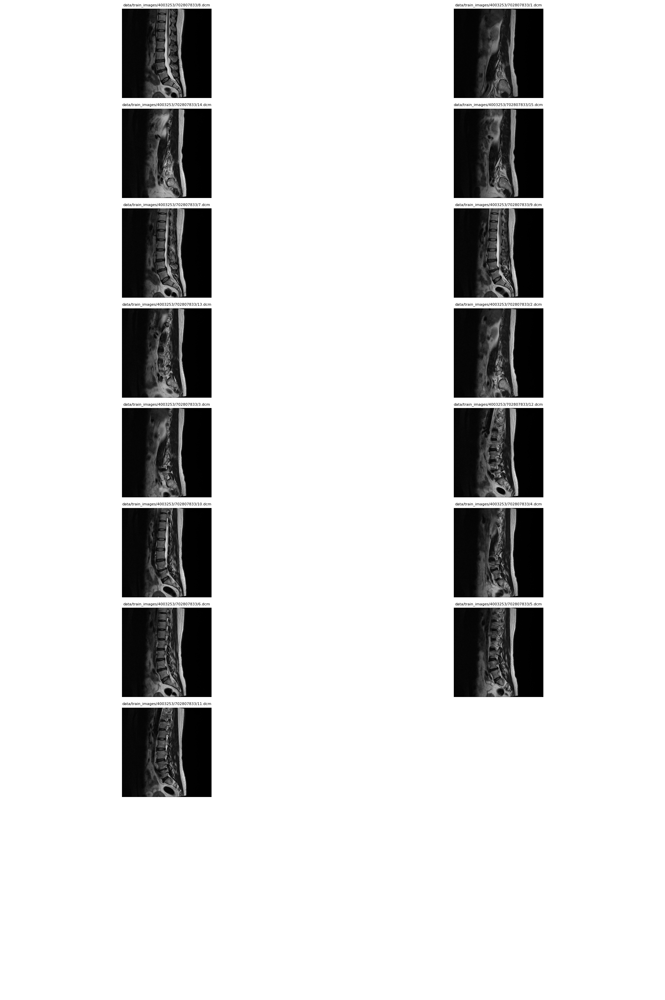

In [131]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
from PIL import Image

def display_images_in_grid(df, images_per_row=3, rows=1):
    # Calculate the total number of images to display
    total_images = images_per_row * rows
    
    # Filter for the specified range of images
    image_paths = df['image_path'].dropna().iloc[:total_images]

    # Initialize the figure
    fig, axes = plt.subplots(rows, images_per_row, figsize=(20, rows * 3))
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    
    for i, image_path in enumerate(image_paths):
        # Load the DICOM image using SimpleITK
        image = sitk.ReadImage(image_path)
        image_array = sitk.GetArrayFromImage(image)  # Convert to NumPy array
        image_array = np.squeeze(image_array)  # Remove single-dimensional entries

        # Convert NumPy array to PIL Image
        pil_image = Image.fromarray(image_array)
        
        # Display the image
        axes[i].imshow(pil_image, cmap='gray')
        axes[i].axis('off')
        
        # Add the image path as the title (or modify as needed)
        axes[i].set_title(image_path, fontsize=8)  # Adjust font size for readability
    
    # Turn off any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
display_images_in_grid(df_end, images_per_row=2, rows=10)


In [132]:
import pandas as pd

# Define the variance function
def image_variance(image_path):
    dicom_image = pydicom.dcmread(image_path)
    image = dicom_image.pixel_array.astype(float)
    return image.var()

# Create a new column for variance in df_end
df_end['variance'] = df_end['image_path'].apply(image_variance)

# Sort and mark top 5 images by variance for each study_id
def mark_top_images(group):
    # Sort by variance descending and add a new column to mark top 5 images
    group = group.sort_values(by='variance', ascending=False).copy()
    group['top_image'] = [True if i < 5 else False for i in range(len(group))]
    return group

# Apply the function to each study_id group
df_end = df_end.groupby('study_id', group_keys=False).apply(mark_top_images)

# Display the top images marked for each study_id
print(df_end[['study_id', 'image_path', 'variance', 'top_image']])


df_end

    study_id                                  image_path      variance  top_image
7    4003253   data/train_images/4003253/702807833/8.dcm  10508.073057       True
0    4003253   data/train_images/4003253/702807833/1.dcm  10095.842300       True
13   4003253  data/train_images/4003253/702807833/14.dcm   9908.412236       True
14   4003253  data/train_images/4003253/702807833/15.dcm   9905.163050       True
6    4003253   data/train_images/4003253/702807833/7.dcm   9891.748972       True
8    4003253   data/train_images/4003253/702807833/9.dcm   9857.395548      False
12   4003253  data/train_images/4003253/702807833/13.dcm   9425.812618      False
1    4003253   data/train_images/4003253/702807833/2.dcm   9313.350631      False
2    4003253   data/train_images/4003253/702807833/3.dcm   9160.069881      False
11   4003253  data/train_images/4003253/702807833/12.dcm   9053.877352      False
9    4003253  data/train_images/4003253/702807833/10.dcm   9006.544530      False
3    4003253   d

,study_id,severity,condition,level,series_id,x,y,image_path,variance,top_image
7,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/8.dcm,10508.073057,True
0,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/1.dcm,10095.842300,True
13,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/14.dcm,9908.412236,True
14,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/15.dcm,9905.163050,True
6,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/7.dcm,9891.748972,True
8,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/9.dcm,9857.395548,False
12,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/13.dcm,9425.812618,False
1,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/2.dcm,9313.350631,False
2,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/3.dcm,9160.069881,False
11,4003253,1,left neural foraminal narrowing,l5/s1,1054713880,197.100569,289.457306,data/train_images/4003253/702807833/12.dcm,9053.877352,False


    study_id                                  image_path      variance  top_image
7    4003253   data/train_images/4003253/702807833/8.dcm  10508.073057       True
0    4003253   data/train_images/4003253/702807833/1.dcm  10095.842300       True
13   4003253  data/train_images/4003253/702807833/14.dcm   9908.412236       True
14   4003253  data/train_images/4003253/702807833/15.dcm   9905.163050       True
6    4003253   data/train_images/4003253/702807833/7.dcm   9891.748972       True
8    4003253   data/train_images/4003253/702807833/9.dcm   9857.395548      False
12   4003253  data/train_images/4003253/702807833/13.dcm   9425.812618      False
1    4003253   data/train_images/4003253/702807833/2.dcm   9313.350631      False
2    4003253   data/train_images/4003253/702807833/3.dcm   9160.069881      False
11   4003253  data/train_images/4003253/702807833/12.dcm   9053.877352      False
9    4003253  data/train_images/4003253/702807833/10.dcm   9006.544530      False
3    4003253   d

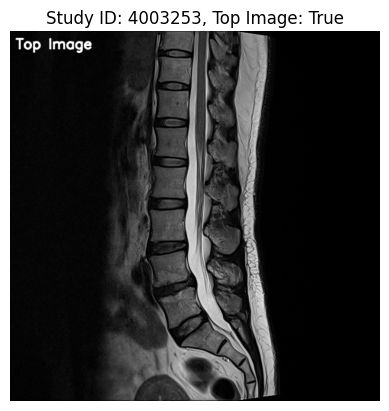

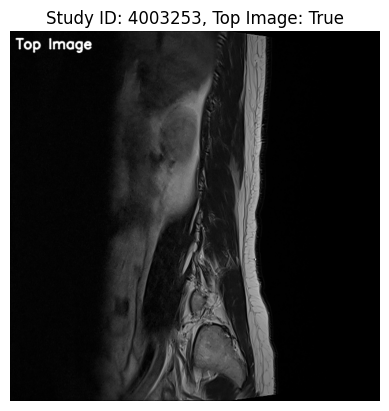

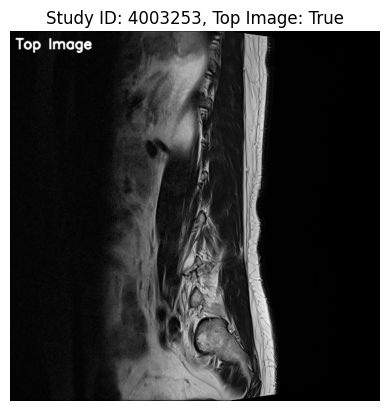

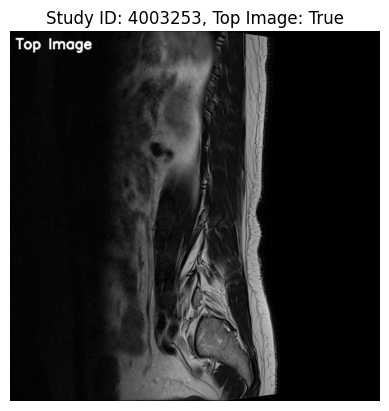

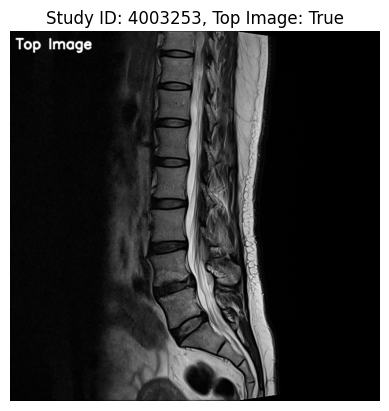

...

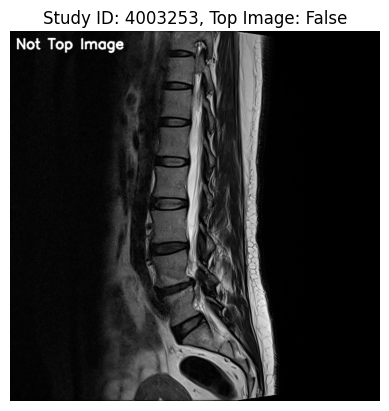

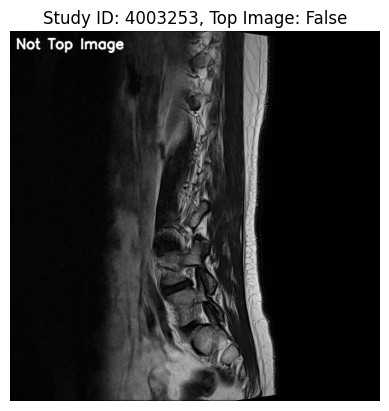

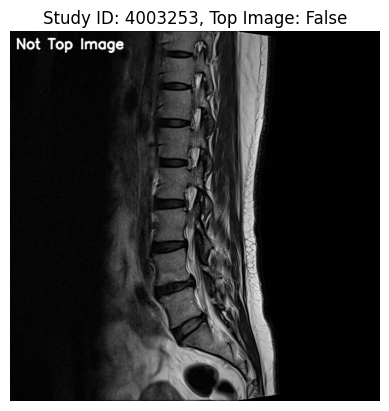

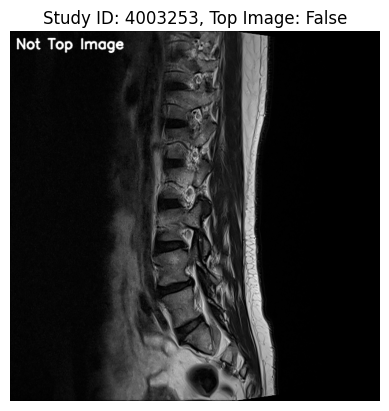

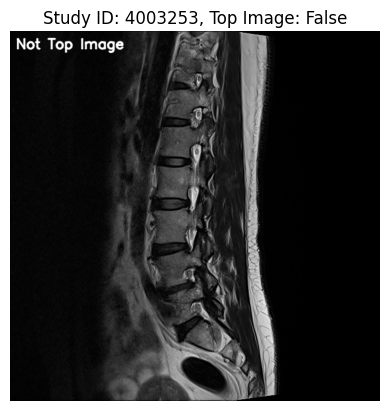

In [130]:
import pandas as pd
import cv2
import pydicom
import matplotlib.pyplot as plt

# Define the variance function
def image_variance(image_path):
    dicom_image = pydicom.dcmread(image_path)
    image = dicom_image.pixel_array.astype(float)
    return image.var()

# Create a new column for variance in df_end
df_end['variance'] = df_end['image_path'].apply(image_variance)

# Sort and mark top 5 images by variance for each study_id
def mark_top_images(group):
    # Sort by variance descending and add a new column to mark top 5 images
    group = group.sort_values(by='variance', ascending=False).copy()
    group['top_image'] = [True if i < 5 else False for i in range(len(group))]
    return group

# Apply the function to each study_id group
df_end = df_end.groupby('study_id', group_keys=False).apply(mark_top_images)

# Display the top images marked for each study_id
print(df_end[['study_id', 'image_path', 'variance', 'top_image']])

# Function to display the image with its label
def display_image_with_label(row):
    # Load the DICOM image
    dicom_image = pydicom.dcmread(row['image_path'])
    image = dicom_image.pixel_array.astype(float)
    
    # Normalize to uint8 for display
    image = (image / image.max() * 255).astype('uint8')
    
    # Add label on the image
    label = "Top Image" if row['top_image'] else "Not Top Image"
    cv2.putText(image, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2, cv2.LINE_AA)
    
    # Display the image
    plt.imshow(image, cmap="gray")
    plt.title(f"Study ID: {row['study_id']}, Top Image: {row['top_image']}")
    plt.axis('off')
    plt.show()

# Apply the function to each row in the DataFrame to display images
for idx, row in df_end.iterrows():
    display_image_with_label(row)


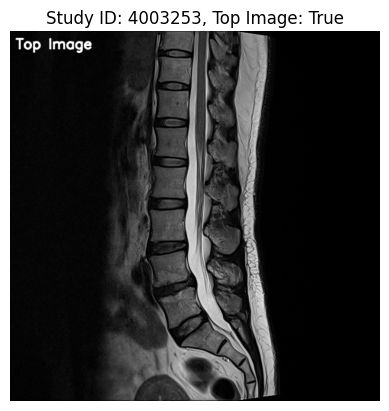

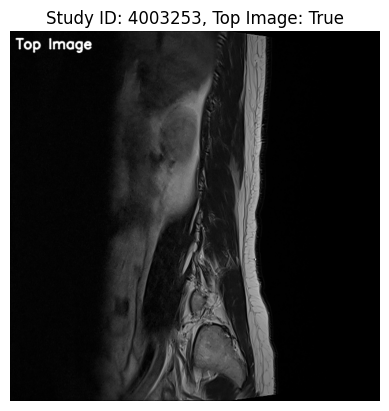

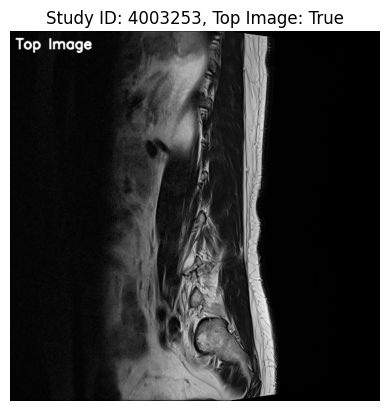

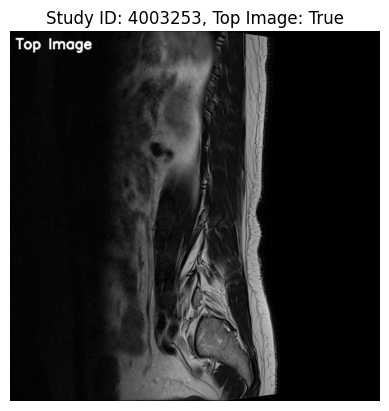

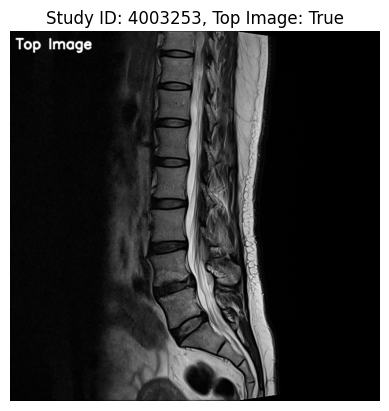

...

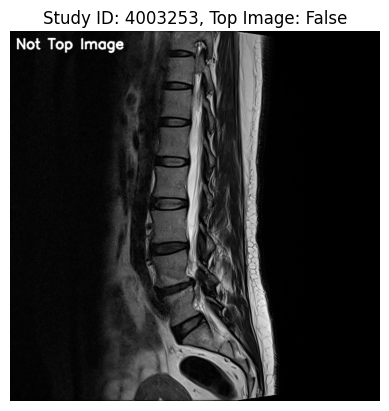

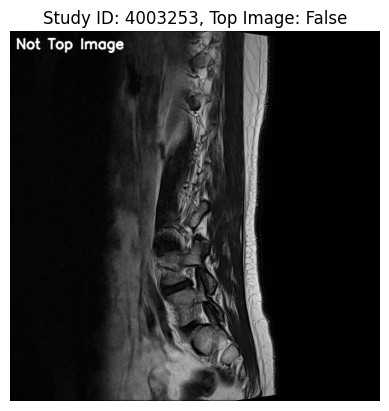

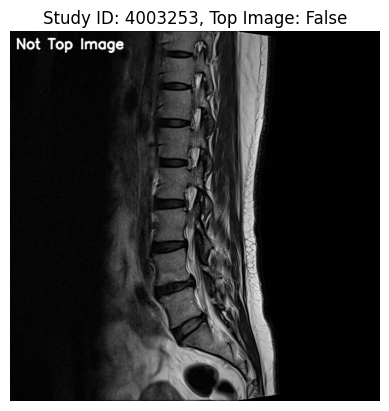

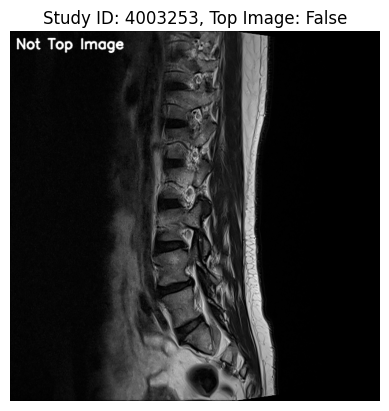

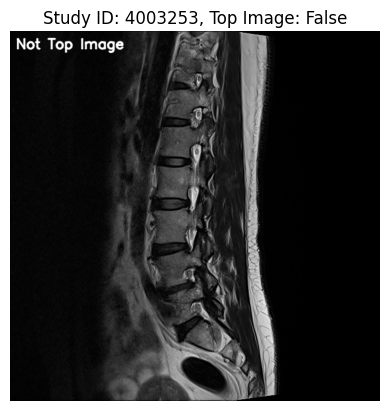

In [129]:
import cv2
import pydicom
import matplotlib.pyplot as plt

# Function to display the image with its label
def display_image_with_label(row):
    # Load the DICOM image
    dicom_image = pydicom.dcmread(row['image_path'])
    image = dicom_image.pixel_array.astype(float)
    
    # Normalize to uint8 for display
    image = (image / image.max() * 255).astype('uint8')
    
    # Add label on the image
    label = "Top Image" if row['top_image'] else "Not Top Image"
    cv2.putText(image, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2, cv2.LINE_AA)
    
    # Display the image
    plt.imshow(image, cmap="gray")
    plt.title(f"Study ID: {row['study_id']}, Top Image: {row['top_image']}")
    plt.axis('off')
    plt.show()

# Apply the function to each row in the DataFrame
for idx, row in df_end.iterrows():
    display_image_with_label(row)


### getting three folders with different severity

In [ ]:
# creating random samples
def get_df_random(df, severity, n=100, random_state=42):
    severity_df = df[df['severity'] == severity]
    return severity_df.sample(n=n, random_state=random_state)

RSEED = 42  # Define the random seed

df_random_1 = get_df_random(df_end, severity=1, n=100, random_state=RSEED)
df_random_2 = get_df_random(df_end, severity=2, n=100, random_state=RSEED)
df_random_3 = get_df_random(df_end, severity=3, n=100, random_state=RSEED)

random_list = [df_random_1, df_random_2, df_random_3]
for ran in random_list:
    print(ran.head())  # Display the head of each DataFrame

# Concatenate the DataFrames
df_random = pd.concat(random_list) 
df_random.head()

In [ ]:
df_random_3

In [ ]:
# Check for NaN values in the image_path column
print("NaN values in image_path column:")
print(df_random_3[df_random_3['image_path'].isna()])

# Option 1: Drop rows with NaN values in image_path
df_random_3 = df_random_3.dropna(subset=['image_path'])
print(df_random_3.info())

In [ ]:
# Check the DataFrame info and types
print(df_random_3.info())
# Convert image_path to string if necessary
df_random_3['image_path'] = df_random_3['image_path'].astype(str)
# Print out the image_path values to inspect
print(df_random_3['image_path'].head())

In [ ]:
df_random_3

### problems with data frame still some missings in image_pcht

In [ ]:
# Step 1: Check how many NaN values are present
num_nan = df_random_3['image_path'].isna().sum()
print(f"Number of NaN values in image_path column: {num_nan}")

# Step 2: Remove rows with NaN values in image_path
df_random_3 = df_random_3.dropna(subset=['image_path'])

# Step 3: Verify that all NaN values are removed
num_nan_after = df_random_3['image_path'].isna().sum()
print(f"Number of NaN values in image_path column after deletion: {num_nan_after}")

# Print the updated DataFrame to confirm changes
print("Updated DataFrame:")
df_random_3.head(100)
# Print study_id if it matches a specific condition
# Assuming df_random_3 is your DataFrame
study_id_to_filter = 4003253  # Specify the study_id you want to filter

# Filter the DataFrame for the specified study_id
filtered_data = df_random_3[df_random_3['study_id'] == study_id_to_filter]

# Print the filtered DataFrame
print("Filtered Data for study_id 4003253:")
print(filtered_data)
 

In [ ]:
df_random_3.head()

## first try 

### checking images for df_random_3

In [ ]:
import pydicom
import matplotlib.pyplot as plt

# Example of loading a DICOM image
image_path = 'data/train_images/1028909382/1477339972/24.dcm'
dicom_image = pydicom.dcmread(image_path)
image_array = dicom_image.pixel_array

# Sample coordinates
x, y = 324.887984, 485.865580

plt.imshow(image_array, cmap="gray")
plt.scatter(x, y, color='red', s=30)  # s controls marker size
plt.title("MRI with Point Annotation")
plt.show()

In [ ]:
def image_variance(image_path):
    dicom_image = pydicom.dcmread(image_path)
    image = dicom_image.pixel_array.astype(float)
    return image.var()  # Calculate variance as a proxy for clarity

# Calculate variance for each Sagittal T2 image and filter
sagittal_images['variance'] = sagittal_images['image_path'].apply(image_variance)
best_sagittal_images = sagittal_images.sort_values(by='variance', ascending=False).head(5)  # Top 5 images

In [121]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
from PIL import Image

def display_images_in_grid(df, images_per_row=3, rows=1):
    # Calculate the total number of images to display
    total_images = images_per_row * rows
    
    # Filter for the specified range of images
    image_paths = df['image_path'].dropna().iloc[:total_images]

    # Initialize the figure
    fig, axes = plt.subplots(rows, images_per_row, figsize=(20, rows * 3))
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    
    for i, image_path in enumerate(image_paths):
        # Load the DICOM image using SimpleITK
        image = sitk.ReadImage(image_path)
        image_array = sitk.GetArrayFromImage(image)  # Convert to NumPy array
        image_array = np.squeeze(image_array)  # Remove single-dimensional entries

        # Convert NumPy array to PIL Image
        pil_image = Image.fromarray(image_array)
        
        # Display the image
        axes[i].imshow(pil_image, cmap='gray')
        axes[i].axis('off')
    
    # Turn off any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
display_images_in_grid(df_random_3, images_per_row=2, rows=12)


NameError: name 'df_random_3' is not defined

In [ ]:
df_random_3.head(10)

### Setting a model resnet50

### one person only for checking

In [156]:
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
from torchvision import transforms
import pydicom
import cv2
import pandas as pd

class MRIDataset(Dataset):
    def __init__(self, data, transform=None, mode='classification', box_size=50):
        self.data = data
        self.transform = transform
        self.mode = mode
        self.box_size = box_size

    def create_bounding_box(self, x, y, img_shape):
        x_min = max(0, int(x - self.box_size / 2))
        y_min = max(0, int(y - self.box_size / 2))
        x_max = min(img_shape[1], int(x + self.box_size / 2))
        y_max = min(img_shape[0], int(y + self.box_size / 2))
        return x_min, y_min, x_max, y_max

    def __getitem__(self, index):
        row = self.data.iloc[index]
        image_path = row['image_path']
        x, y = row['x'], row['y']
        label = row['condition'] if self.mode == 'classification' else (x, y)

        dicom_image = pydicom.dcmread(image_path)
        image = dicom_image.pixel_array.astype(float)
        image = (image / image.max() * 255).astype('uint8')  # Normalize

        if self.mode == 'localization':
            x_min, y_min, x_max, y_max = self.create_bounding_box(x, y, image.shape)
            roi = image[y_min:y_max, x_min:x_max]
            roi = cv2.resize(roi, (224, 224))
            image_tensor = self.transform(roi) if self.transform else roi
        else:
            annotated_image = image.copy()
            cv2.circle(annotated_image, (int(x), int(y)), 10, (255, 0, 0), -1)
            annotated_image = cv2.resize(annotated_image, (224, 224))
            image_tensor = self.transform(annotated_image) if self.transform else annotated_image

        # Convert grayscale (1 channel) to RGB (3 channels)
        if image_tensor.ndim == 2:
            image_tensor = torch.from_numpy(image_tensor).unsqueeze(0)  # Add channel dimension
        image_tensor = image_tensor.repeat(3, 1, 1)  # Duplicate to 3 channels

        return image_tensor, label

    def __len__(self):
        return len(self.data)



In [ ]:
# Transformations for the images
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

# Sample Data for one person  
data = pd.DataFrame({
    'image_path': ['data/train_images/1028909382/1477339972/24.dcm'],
    'x': [324.88], 'y': [485.87], 'condition': [1]    # since als persons belong to persons with df_random_3
})
dataset = MRIDataset(data=data, transform=transform, mode='classification')
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

# Load ResNet-50 and Set Mode
mode = 'classification'  # my goal is to classify the images
num_classes = 3   # 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = models.resnet50(pretrained=True)
if mode == 'classification':
    model.fc = nn.Linear(model.fc.in_features, num_classes)
else:
    model.fc = nn.Linear(model.fc.in_features, 4)

model.to(device)


criterion = nn.CrossEntropyLoss() if mode == 'classification' else nn.SmoothL1Loss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
num_epochs = 10

for epoch in range(num_epochs):
    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        
        if mode == 'classification':
            loss = criterion(outputs, labels)
        else:
            loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

###  Plot for images for different samples

Step 1: Define the Custom Dataset Class

    Create Bounding Boxes or Markers: Annotate the images with bounding boxes or markers around the coordinates during preprocessing.
    Transform the Images: Ensure that images are resized to fit the ResNet-50 input size (224x224).
    Return Annotations: If you plan to use the data for localization, return the bounding box coordinates as labels.

In [ ]:

import torch
from torch.utils.data import Dataset, DataLoader
import cv2
%pip install torchvision
from torchvision import transforms

class MRIDataset(Dataset):
    def __init__(self, data, transform=None, mode='classification', box_size=50):
        """
        data: A DataFrame or list containing image paths, coordinates (x, y), and labels.
        transform: Transformations to apply to the image.
        mode: 'classification' or 'localization'
        box_size: Size of bounding box around the (x, y) coordinates.
        """
        self.data = data
        self.transform = transform
        self.mode = mode
        self.box_size = box_size

    def create_bounding_box(self, x, y, img_shape):
        x_min = max(0, int(x - self.box_size / 2))
        y_min = max(0, int(y - self.box_size / 2))
        x_max = min(img_shape[1], int(x + self.box_size / 2))
        y_max = min(img_shape[0], int(y + self.box_size / 2))
        return x_min, y_min, x_max, y_max

    def __getitem__(self, index):
        # Get image path, coordinates, and labels
        row = self.data.iloc[index]
        image_path = row['image_path']
        x, y = row['x'], row['y']
        label = row['condition'] if self.mode == 'classification' else (x, y)

        # Load DICOM image and convert to a grayscale numpy array
        dicom_image = pydicom.dcmread(image_path)
        image = dicom_image.pixel_array

        # Create bounding box around (x, y) coordinates
        if self.mode == 'localization':
            x_min, y_min, x_max, y_max = self.create_bounding_box(x, y, image.shape)
            roi = image[y_min:y_max, x_min:x_max]
            roi = cv2.resize(roi, (224, 224))  # Resize ROI to model input size
        else:
            # Annotate the image for classification
            annotated_image = image.copy()
            cv2.circle(annotated_image, (int(x), int(y)), 10, (255, 0, 0), -1)
            annotated_image = cv2.resize(annotated_image, (224, 224))

        # Convert image to PIL format and apply transformations
        if self.transform:
            if self.mode == 'localization':
                image_tensor = self.transform(roi)
            else:
                image_tensor = self.transform(annotated_image)

        return image_tensor, label

    def __len__(self):
        return len(self.data)

Step 2: Define Transformations and Instantiate the DataLoader

We’ll use standard transformations for ResNet-50, including resizing and normalization. Here’s how to set up the data loader:

In [159]:
from torchvision import transforms

# Define transformations for ResNet-50
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])  # Assuming grayscale images
])

# Assuming `data` is a DataFrame containing columns ['image_path', 'x', 'y', 'condition']
dataset = MRIDataset(data=df_random_3, transform=transform, mode='classification')  # or 'localization'
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

Step 3: Set Up ResNet-50 for Classification or Localization

    Classification: Use ResNet-50’s default architecture with the final layer modified to output the number of classes.

In [160]:
import torchvision.models as models
import torch.nn as nn

# Load ResNet-50 and modify the final layer
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)  # Set to number of conditions since i have got only one damage

In [161]:
# Localization: Modify final layer to output 4 coordinates (x_min, y_min, x_max, y_max)
model.fc = nn.Linear(model.fc.in_features, 4)  # Output bounding box coordinates


Step 4: Training the Model

Finally, set up the training loop to handle either classification or localization. For classification, use CrossEntropyLoss. For localization, you can use SmoothL1Loss for bounding box prediction.

In [162]:
image_array = (image_array / image_array.max() * 255).astype(np.uint8)
image_array = image_array.astype(np.float32) / image_array.max()

In [ ]:
import torch.optim as optim

num_epochs = 6 # Define the number of epochs

criterion = nn.CrossEntropyLoss() if mode == 'classification' else nn.SmoothL1Loss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

In [ ]:
s

In [ ]:
s

In [ ]:
# Sample coordinates
x, y = 324.887984, 485.865580

plt.imshow(image_array, cmap="gray")
plt.scatter(x, y, color='red', s=30)  # s controls marker size
plt.title("MRI with Point Annotation")
plt.show()